# Phase 3 mini-project

## Dataset Information

This dataset contains information on default payments, demographic factors, credit data, history of payment, and bill statements of credit card clients in Taiwan from April 2005 to September 2005.  

There are 25 variables:

- ID: ID of each client
- LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit
- SEX: Gender (1=male, 2=female)
- EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown, 0=unknown)
- MARRIAGE: Marital status (1 = married; 2 = single; 3 = divorce; 0=others)
- AGE: Age in years
- PAY_0: Repayment status in September, 2005 (-2: No consumption, -1=paid in full, 0=Use of revolving credit, 1=payment delay for one month, 2=payment delay for two months, … 8=payment delay for eight months, 9=payment delay for nine months and above)
- PAY_2: Repayment status in August, 2005 (scale same as above)
- PAY_3: Repayment status in July, 2005 (scale same as above)
- PAY_4: Repayment status in June, 2005 (scale same as above)
- PAY_5: Repayment status in May, 2005 (scale same as above)
- PAY_6: Repayment status in April, 2005 (scale same as above)
- BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
- BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
- BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
- BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
- BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
- BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
- PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
- PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
- PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
- PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
- PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
- PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
- default.payment.next.month: Default payment (1=yes, 0=no)

Some ideas for exploration:

1. How does the probability of default payment vary by categories of different demographic variables?
2. Which variables are the strongest predictors of default payment?

## Data cleaning and EDA
**Output** - df

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LassoCV, LassoLarsCV, LassoLarsIC, LogisticRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_squared_log_error, plot_confusion_matrix, confusion_matrix, precision_score, recall_score, accuracy_score, f1_score, classification_report, roc_curve, auc, roc_auc_score
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler, OneHotEncoder, StandardScaler, scale
from sklearn import metrics
from sklearn.feature_selection import VarianceThreshold, f_regression, mutual_info_regression, SelectKBest, RFE, RFECV
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.neighbors import KNeighborsClassifier
from collections import defaultdict
from sklearn.naive_bayes import GaussianNB, ComplementNB, MultinomialNB, BernoulliNB, CategoricalNB
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier


In [2]:
# Import the data

df = pd.read_csv('UCI_Credit_Card.csv')
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
ID                            30000 non-null int64
LIMIT_BAL                     30000 non-null float64
SEX                           30000 non-null int64
EDUCATION                     30000 non-null int64
MARRIAGE                      30000 non-null int64
AGE                           30000 non-null int64
PAY_0                         30000 non-null int64
PAY_2                         30000 non-null int64
PAY_3                         30000 non-null int64
PAY_4                         30000 non-null int64
PAY_5                         30000 non-null int64
PAY_6                         30000 non-null int64
BILL_AMT1                     30000 non-null float64
BILL_AMT2                     30000 non-null float64
BILL_AMT3                     30000 non-null float64
BILL_AMT4                     30000 non-null float64
BILL_AMT5                     30000 non-null float64
BILL_AMT6   

In [4]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [5]:
for col in df.columns:
    print(df[col].value_counts())

2047     1
1322     1
15629    1
9486     1
11535    1
        ..
17053    1
23198    1
21151    1
10928    1
2049     1
Name: ID, Length: 30000, dtype: int64
50000.0      3365
20000.0      1976
30000.0      1610
80000.0      1567
200000.0     1528
             ... 
780000.0        2
690000.0        1
1000000.0       1
760000.0        1
327680.0        1
Name: LIMIT_BAL, Length: 81, dtype: int64
2    18112
1    11888
Name: SEX, dtype: int64
2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64
2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64
29    1605
27    1477
28    1409
30    1395
26    1256
31    1217
25    1186
34    1162
32    1158
33    1146
24    1127
35    1113
36    1108
37    1041
39     954
38     944
23     931
40     870
41     824
42     794
44     700
43     670
45     617
46     570
22     560
47     501
48     466
49     452
50     411
51     340
53     325
52     304
54     247
55     209
5

In [6]:
df.duplicated().sum()

0

In [7]:
df['default.payment.next.month'].value_counts() # Definite class imbalance, may need to address

0    23364
1     6636
Name: default.payment.next.month, dtype: int64

## Examine negative values

Was thinking maybe this is invalid data.  But credit card balances can be negative meaning they have a credit.

In [8]:
df[(df['BILL_AMT1']<0) | (df['BILL_AMT2']<0) | (df['BILL_AMT3']<0) | 
   (df['BILL_AMT4']<0) | (df['BILL_AMT5']<0) | (df['BILL_AMT6']<0)]#['default.payment.next.month']
# df[(df.origin == "JFK") & (df.carrier == "B6")]

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
7,8,100000.0,2,2,2,23,0,-1,-1,0,...,221.0,-159.0,567.0,380.0,601.0,0.0,581.0,1687.0,1542.0,0
26,27,60000.0,1,1,2,27,1,-2,-1,-1,...,-57.0,127.0,-189.0,0.0,1000.0,0.0,500.0,0.0,1000.0,1
35,36,160000.0,1,1,2,30,-1,-1,-2,-2,...,-923.0,-1488.0,-1884.0,131.0,396.0,396.0,565.0,792.0,0.0,0
37,38,60000.0,2,2,2,22,0,0,0,0,...,6026.0,-28335.0,18660.0,1500.0,1518.0,2043.0,0.0,47671.0,617.0,0
56,57,180000.0,2,3,1,34,0,0,0,-1,...,7142.0,-679.0,8321.0,8500.0,1500.0,7500.0,679.0,9000.0,2000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29931,29932,60000.0,1,2,3,41,0,0,0,0,...,26940.0,9971.0,-11798.0,2200.0,2000.0,1200.0,0.0,0.0,28000.0,0
29958,29959,230000.0,1,3,2,31,0,-1,-1,-1,...,417.0,613.0,-191.0,1000.0,1000.0,1000.0,1000.0,0.0,0.0,0
29962,29963,50000.0,1,2,2,30,1,-1,2,-1,...,7300.0,0.0,0.0,528.0,0.0,7300.0,0.0,0.0,0.0,0
29989,29990,150000.0,1,1,2,35,-1,-1,-1,-1,...,780.0,0.0,0.0,9054.0,0.0,783.0,0.0,0.0,0.0,0


## Make categorical variables and get dummies
**Output** - categoricals, one_hot_df, X, y  (Note: X and y are now one hot encoded)

In [9]:
categoricals = ['SEX','EDUCATION','MARRIAGE','PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']
for col in categoricals:
    df[col]=df[col].astype('category')

In [10]:
one_hot_df = pd.get_dummies(df)
one_hot_df.head()

,ID,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,...,PAY_6_-2,PAY_6_-1,PAY_6_0,PAY_6_2,PAY_6_3,PAY_6_4,PAY_6_5,PAY_6_6,PAY_6_7,PAY_6_8
0,1,20000.0,24,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
1,2,120000.0,26,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,...,0,0,0,1,0,0,0,0,0,0
2,3,90000.0,34,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,...,0,0,1,0,0,0,0,0,0,0
3,4,50000.0,37,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,...,0,0,1,0,0,0,0,0,0,0
4,5,50000.0,57,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,...,0,0,1,0,0,0,0,0,0,0


In [11]:
# ID column is irrelevent
X = one_hot_df.drop(columns=['default.payment.next.month','ID'])
y = one_hot_df['default.payment.next.month']

## Train, test, split
**Output** - X_train, X_test, y_train, y_test, train_df, test_df

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=17)
train_df = pd.concat([X_train, y_train], axis=1) 
test_df = pd.concat([X_test, y_test], axis=1)

print('X_train: ', X_train.shape, '\nX_test: ', X_test.shape)

X_train:  (22500, 91) 
X_test:  (7500, 91)


## Perform SMOTE for class imbalance
**Output** - X_train_resampled, y_train_resampled   --- Have only used these in Bayes models because I created the other models before I did this

In [13]:
#  Question here - should I SMOTE the scaled X, or the unscaled but ohe X
#
#  Seems like SMOTE should be done before scaling
#
#  Then I can choose to use scaled for Log Reg and KNN, but unscaled for Decision Tree
#
#  One of the labs did SMOTE before the train test split.  I think maybe it is better to do after the split so I am
#   not making any changes to my test data.

# Previous original class distribution
print('Original class distribution: \n')
print(y.value_counts())
smote = SMOTE(random_state=10)
X_train_resampled, y_train_resampled = smote.fit_sample(X_train, y_train) 
# Preview synthetic sample class distribution
print('-----------------------------------------')
print('Synthetic sample class distribution: \n')
print(pd.Series(y_train_resampled).value_counts()) 

Original class distribution: 

0    23364
1     6636
Name: default.payment.next.month, dtype: int64
-----------------------------------------
Synthetic sample class distribution: 

1    17510
0    17510
Name: default.payment.next.month, dtype: int64


## Scale variables
**Output** - scaler, scaled_data_train, scaled_data_test, scaled_X_train, scaled_X_test

In [14]:
# Instantiate StandardScaler
scaler = StandardScaler()

# Transform the training and test sets
scaled_data_train = scaler.fit_transform(X_train)
scaled_data_test = scaler.transform(X_test)

# Convert into a DataFrame
scaled_X_train = pd.DataFrame(scaled_data_train, columns=X_train.columns)
scaled_X_test = pd.DataFrame(scaled_data_test, columns=X_train.columns)
scaled_X_test.head()

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,...,PAY_6_-2,PAY_6_-1,PAY_6_0,PAY_6_2,PAY_6_3,PAY_6_4,PAY_6_5,PAY_6_6,PAY_6_7,PAY_6_8
0,-0.288898,-0.920456,0.348532,0.421797,0.488121,0.601002,0.716778,0.786611,-0.135025,-0.088254,...,-0.440398,-0.485581,0.915962,-0.320001,-0.07827,-0.040032,-0.017641,-0.024952,-0.037144,-0.009429
1,-0.134465,0.598337,0.178508,0.110441,-0.212289,-0.349144,-0.315319,1.765031,-0.248120,-0.210603,...,-0.440398,-0.485581,0.915962,-0.320001,-0.07827,-0.040032,-0.017641,-0.024952,-0.037144,-0.009429
2,-0.288898,-0.811971,1.104133,1.194427,1.244432,1.385759,1.523924,1.574587,0.084076,0.046146,...,-0.440398,-0.485581,0.915962,-0.320001,-0.07827,-0.040032,-0.017641,-0.024952,-0.037144,-0.009429
3,-0.752196,1.574704,-0.327473,-0.710788,-0.427164,-0.397427,-0.365294,-0.342327,-0.293487,0.577566,...,-0.440398,-0.485581,0.915962,-0.320001,-0.07827,-0.040032,-0.017641,-0.024952,-0.037144,-0.009429
4,-1.138278,0.815307,-0.543539,-0.519139,-0.480649,-0.449824,-0.422292,-0.401448,-0.282918,-0.198687,...,-0.440398,-0.485581,0.915962,-0.320001,-0.07827,-0.040032,-0.017641,-0.024952,-0.037144,-0.009429


In [15]:
''' You may have noticed that the scaler also scaled our binary/one-hot encoded columns, too! 
Although it doesn't look as pretty, this has no negative effect on the model. Each 1 and 0 have been
replaced with corresponding decimal values, but each binary column still only contains 2 values, meaning
the overall information content of each column has not changed.'''
scaled_X_train.PAY_6_4.value_counts()

-0.040032     22464
 24.979992       36
Name: PAY_6_4, dtype: int64

## Define model metrics

**Output** - print_roc(), print_confusion_matrices(), print_metrics()

In [16]:
def print_roc(false_positive_rate, true_positive_rate):    
    roc_auc = auc(false_positive_rate, true_positive_rate)
    print('AUC: {}'.format(auc(false_positive_rate, true_positive_rate)))
    print('----------------------------------------------')
    plt.plot(false_positive_rate, true_positive_rate, color='blue', lw=2, label='ROC curve')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.yticks([i/10.0 for i in range(11)])
    plt.xticks([i/10.0 for i in range(11)])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()

In [17]:
def print_confusion_matrices(model, X_train, X_test, y_train, y_test, y_train_preds, y_test_preds):
    print('\nTRAIN Confusion Matrix')
    print('----------------')
    plot_confusion_matrix(model, X_train, y_train, values_format='.8g')
    print("Number of mislabeled training points out of a total {} points : {}, percentage = {:.4%}"
          .format(X_train.shape[0], (y_train != y_train_preds).sum(), (y_train != y_train_preds).sum()/X_train.shape[0]))
    plt.show()
    print('\nTEST Confusion Matrix')
    print('----------------')
    plot_confusion_matrix(model, X_test, y_test, values_format='.4g')
    print("Number of mislabeled test points out of a total {} points : {}, percentage = {:.4%}"
          .format(X_test.shape[0], (y_test != y_test_preds).sum(), (y_test != y_test_preds).sum()/X_test.shape[0]))
    plt.show()

In [18]:
def print_metrics(model, X_train, X_test, y_train, y_test):
    # Calculate train and test predictions
    y_test_preds = model.predict(X_test)
    y_train_preds = model.predict(X_train)
    
    # Print scores
    print("Precision Score: Train {0:.5f}, Test {1:.5f}"
          .format(precision_score(y_train, y_train_preds), precision_score(y_test, y_test_preds)))
    print("Recall Score:\t Train {0:.5f}, Test {1:.5f}"
          .format(recall_score(y_train, y_train_preds), recall_score(y_test, y_test_preds)))
    print("Accuracy Score:\t Train {0:.5f}, Test {1:.5f}"
          .format(accuracy_score(y_train, y_train_preds), accuracy_score(y_test, y_test_preds)))
    print("F1 Score:\t Train {0:.5f}, Test {1:.5f}"
          .format(f1_score(y_train, y_train_preds), f1_score(y_test, y_test_preds)))
    print('----------------')
    
    # Create and print train & test confusion matrices 
    print_confusion_matrices(model, X_train, X_test, y_train, y_test, y_train_preds, y_test_preds)
    print('----------------')  
    
    # print classification report
    print(classification_report(y_test, y_test_preds))
    
    # Check the AUC for predictions
    if str(model)[:3] == 'Log':
        y_score = model.fit(X_train, y_train).decision_function(X_test)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_score)
        print_roc(false_positive_rate, true_positive_rate)
        print('----------------')
    
    if str(model)[:3] == 'Dec':
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_test_preds)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        print('\nAUC is :{0}'.format(round(roc_auc, 2)))
        fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize = (12,12), dpi=500)
        tree.plot_tree(model, feature_names = X_train.columns, 
               class_names=np.unique(y).astype('str'),
               filled = True)
        plt.show()
    

## Logistic Regression

**Output** - logreg1, logreg2

Ran on ohe and scaled data

### Initial Logistic Regression model
<pre>
Precision Score: Train 0.67720, Test 0.66631  
Recall Score:    Train 0.37796, Test 0.37728  
Accuracy Score:  Train 0.82209, Test 0.82187  
F1 Score:        Train 0.48514, Test 0.48177
</pre>

Precision Score: Train 0.67720, Test 0.66631
Recall Score:	 Train 0.37796, Test 0.37728
Accuracy Score:	 Train 0.82209, Test 0.82187
F1 Score:	 Train 0.48514, Test 0.48177
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4003, percentage = 17.7911%


C:\Users\melod\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


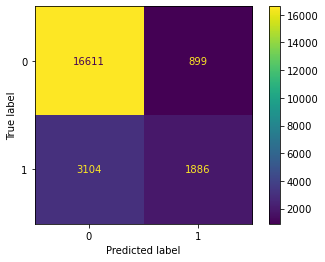


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1336, percentage = 17.8133%


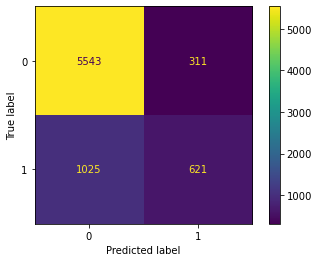

----------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5854
           1       0.67      0.38      0.48      1646

    accuracy                           0.82      7500
   macro avg       0.76      0.66      0.69      7500
weighted avg       0.80      0.82      0.80      7500

AUC: 0.7643080657273525
----------------------------------------------


C:\Users\melod\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


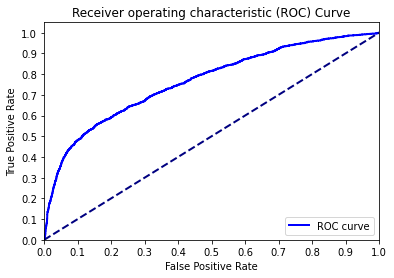

----------------


In [19]:
logreg1 = LogisticRegression(fit_intercept=False, C=1e20, solver='lbfgs')
logreg1 = logreg1.fit(scaled_X_train, y_train)

print_metrics(logreg1, scaled_X_train, scaled_X_test, y_train, y_test)

### Logistic Regression with balanced classes
<pre>
Precision Score: Train 0.50521, Test 0.48598  
Recall Score:    Train 0.58297, Test 0.56865  
Accuracy Score:  Train 0.78089, Test 0.77333  
F1 Score:        Train 0.54131, Test 0.52408
</pre>

Precision Score: Train 0.50521, Test 0.48598
Recall Score:	 Train 0.58297, Test 0.56865
Accuracy Score:	 Train 0.78089, Test 0.77333
F1 Score:	 Train 0.54131, Test 0.52408
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4930, percentage = 21.9111%


C:\Users\melod\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


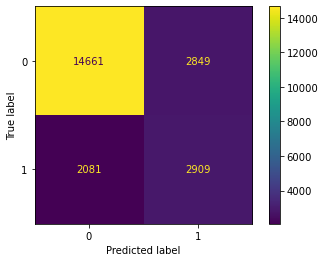


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1700, percentage = 22.6667%


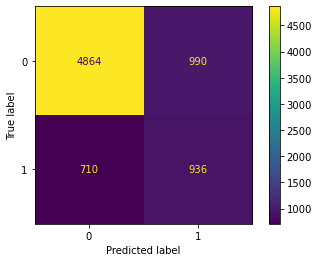

----------------
              precision    recall  f1-score   support

           0       0.87      0.83      0.85      5854
           1       0.49      0.57      0.52      1646

    accuracy                           0.77      7500
   macro avg       0.68      0.70      0.69      7500
weighted avg       0.79      0.77      0.78      7500

AUC: 0.7672708029860672
----------------------------------------------


C:\Users\melod\anaconda3\envs\learn-env\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


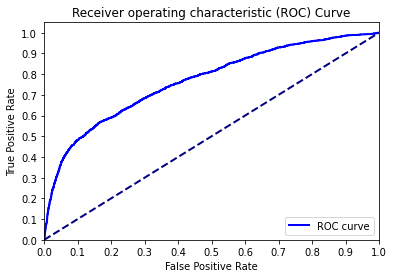

----------------


In [20]:
logreg2 = LogisticRegression(fit_intercept=False, C=1e20, class_weight='balanced', solver='lbfgs')
logreg2 = logreg2.fit(scaled_X_train, y_train)

print_metrics(logreg2, scaled_X_train, scaled_X_test, y_train, y_test)

## KNN models
**Output** - knn1 - knn3, find_best_k()

Ran on ohe and scaled data

### Initial KNN (default of 5)
<pre>
Precision Score: Train 0.73168, Test 0.55051
Recall Score:    Train 0.46834, Test 0.36087
Accuracy Score:  Train 0.84400, Test 0.79507
F1 Score:        Train 0.57111, Test 0.43596
</pre>

Precision Score: Train 0.73168, Test 0.55051
Recall Score:	 Train 0.46834, Test 0.36087
Accuracy Score:	 Train 0.84400, Test 0.79507
F1 Score:	 Train 0.57111, Test 0.43596
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 3510, percentage = 15.6000%


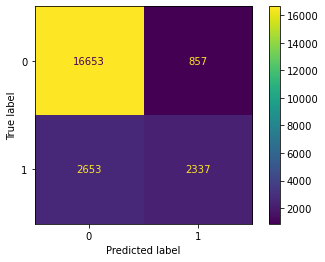


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1537, percentage = 20.4933%


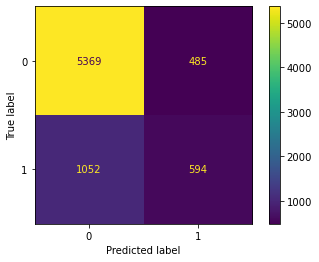

----------------
              precision    recall  f1-score   support

           0       0.84      0.92      0.87      5854
           1       0.55      0.36      0.44      1646

    accuracy                           0.80      7500
   macro avg       0.69      0.64      0.66      7500
weighted avg       0.77      0.80      0.78      7500



In [21]:
knn1 = KNeighborsClassifier()
knn1.fit(scaled_X_train, y_train)

print_metrics(knn1, scaled_X_train, scaled_X_test, y_train, y_test)

In [22]:
def find_best_k(X_train, y_train, X_test, y_test, min_k=1, max_k=25):
    best_k = 0
    best_score = 0.0
    for k in range(min_k, max_k+1, 2):
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        preds = knn.predict(X_test)
        f1 = f1_score(y_test, preds)
        if f1 > best_score:
            best_k = k
            best_score = f1
    
    print("Best Value for k: {}".format(best_k))
    print("F1-Score: {}".format(best_score))

In [23]:
find_best_k(scaled_X_train, y_train, scaled_X_test, y_test)

Best Value for k: 25
F1-Score: 0.4656458578720063


### KNN with calculated best k of 25
<pre>
Precision Score: Train 0.69146, Test 0.65816
Recall Score:    Train 0.37635, Test 0.36027
Accuracy Score:  Train 0.82444, Test 0.81853
F1 Score:        Train 0.48741, Test 0.46565
</pre>

Precision Score: Train 0.69146, Test 0.65816
Recall Score:	 Train 0.37635, Test 0.36027
Accuracy Score:	 Train 0.82444, Test 0.81853
F1 Score:	 Train 0.48741, Test 0.46565
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 3950, percentage = 17.5556%


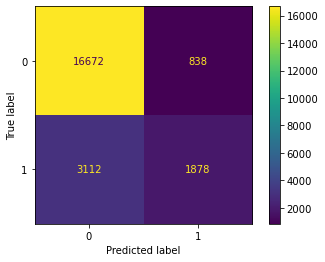


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1361, percentage = 18.1467%


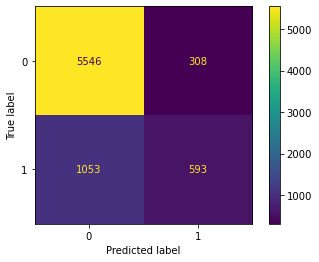

----------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5854
           1       0.66      0.36      0.47      1646

    accuracy                           0.82      7500
   macro avg       0.75      0.65      0.68      7500
weighted avg       0.80      0.82      0.80      7500



In [24]:
knn2 = KNeighborsClassifier(n_neighbors=25, weights='uniform', algorithm='auto', 
                           leaf_size=30, p=2, metric='minkowski', metric_params=None, n_jobs=None)
knn2.fit(scaled_X_train, y_train)

print_metrics(knn2, scaled_X_train, scaled_X_test, y_train, y_test)

### KNN with calculated best k of 25, weights = 'distance'
<pre>
Precision Score: Train 0.99980, Test 0.64590
Recall Score:    Train 0.99880, Test 0.35905
Accuracy Score:  Train 0.99969, Test 0.81613
F1 Score:        Train 0.99930, Test 0.46154
</pre>

Precision Score: Train 0.99980, Test 0.64590
Recall Score:	 Train 0.99880, Test 0.35905
Accuracy Score:	 Train 0.99969, Test 0.81613
F1 Score:	 Train 0.99930, Test 0.46154
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 7, percentage = 0.0311%


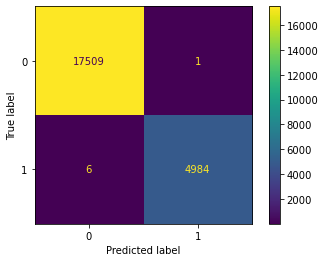


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1379, percentage = 18.3867%


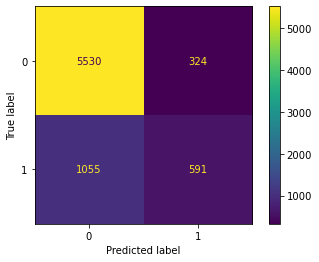

----------------
              precision    recall  f1-score   support

           0       0.84      0.94      0.89      5854
           1       0.65      0.36      0.46      1646

    accuracy                           0.82      7500
   macro avg       0.74      0.65      0.68      7500
weighted avg       0.80      0.82      0.80      7500



In [25]:
knn3 = KNeighborsClassifier(n_neighbors=25, weights='distance', algorithm='auto', 
                           leaf_size=30, p=2, metric='minkowski', metric_params=None, n_jobs=None)
knn3.fit(scaled_X_train, y_train)

print_metrics(knn3, scaled_X_train, scaled_X_test, y_train, y_test)

## Bayes Classification

**Output** - gnb1-4

Ran on ohe data **but not scaled** data, scaling won't affect probabilities

### Initial Gaussian Naive Bayes  
<pre>
Precision Score: Train 0.24639, Test 0.24864
Recall Score:    Train 0.87134, Test 0.88821
Accuracy Score:  Train 0.38040, Test 0.38640
F1 Score:        Train 0.38415, Test 0.38852
</pre>

Precision Score: Train 0.24639, Test 0.24864
Recall Score:	 Train 0.87134, Test 0.88821
Accuracy Score:	 Train 0.38040, Test 0.38640
F1 Score:	 Train 0.38415, Test 0.38852
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 13941, percentage = 61.9600%


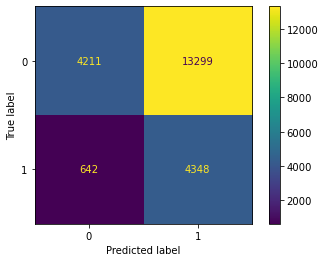


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 4602, percentage = 61.3600%


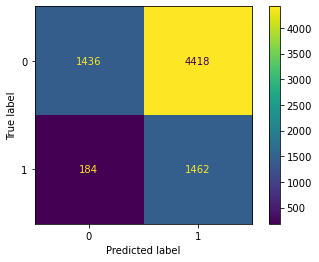

----------------
              precision    recall  f1-score   support

           0       0.89      0.25      0.38      5854
           1       0.25      0.89      0.39      1646

    accuracy                           0.39      7500
   macro avg       0.57      0.57      0.39      7500
weighted avg       0.75      0.39      0.39      7500



In [26]:
gnb1 = GaussianNB()
gnb1.fit(X_train, y_train)

print_metrics(gnb1, X_train, X_test, y_train, y_test)

### Gaussian Naive Bayes on class balanced data (SMOTE)  
<pre>
Precision Score: Train 0.52612, Test 0.23927
Recall Score:    Train 0.93010, Test 0.92770
Accuracy Score:  Train 0.54617, Test 0.33680
F1 Score:        Train 0.67207, Test 0.38042
</pre>

Precision Score: Train 0.52612, Test 0.23927
Recall Score:	 Train 0.93010, Test 0.92770
Accuracy Score:	 Train 0.54617, Test 0.33680
F1 Score:	 Train 0.67207, Test 0.38042
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 35020 points : 15893, percentage = 45.3826%


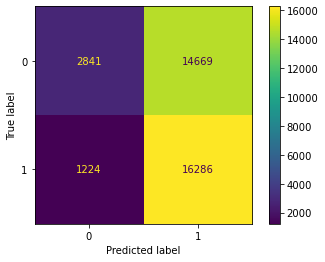


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 4974, percentage = 66.3200%


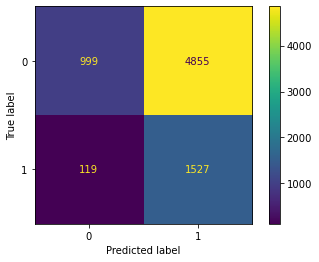

----------------
              precision    recall  f1-score   support

           0       0.89      0.17      0.29      5854
           1       0.24      0.93      0.38      1646

    accuracy                           0.34      7500
   macro avg       0.57      0.55      0.33      7500
weighted avg       0.75      0.34      0.31      7500



In [27]:
gnb2 = GaussianNB() # trying out the SMOTE data
gnb2.fit(X_train_resampled, y_train_resampled)

print_metrics(gnb2, X_train_resampled, X_test, y_train_resampled, y_test)

### Bernoulli Naive Bayes

Can't seem to run ComplementNB, CategoricalNB, or MultinomialNB because of negative values.  Need to understand how to choose which model.
<pre>
Precision Score: Train 0.48894, Test 0.47371
Recall Score:    Train 0.51363, Test 0.50911
Accuracy Score:  Train 0.77307, Test 0.76813
F1 Score:        Train 0.50098, Test 0.49078
</pre>

Precision Score: Train 0.48894, Test 0.47371
Recall Score:	 Train 0.51363, Test 0.50911
Accuracy Score:	 Train 0.77307, Test 0.76813
F1 Score:	 Train 0.50098, Test 0.49078
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 5106, percentage = 22.6933%


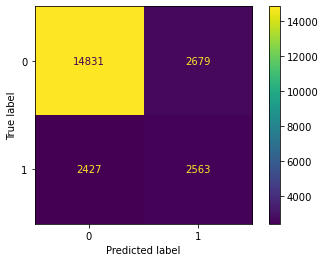


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1739, percentage = 23.1867%


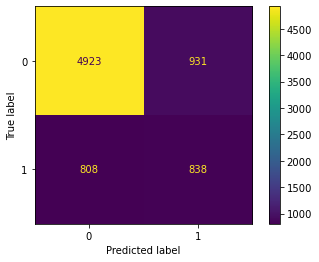

----------------
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      5854
           1       0.47      0.51      0.49      1646

    accuracy                           0.77      7500
   macro avg       0.67      0.68      0.67      7500
weighted avg       0.77      0.77      0.77      7500



In [28]:
gnb3 = BernoulliNB() 
gnb3.fit(X_train, y_train)

print_metrics(gnb3, X_train, X_test, y_train, y_test)

### Bernoulli Naive Bayes on SMOTE data
<pre>
Precision Score: Train 0.85860, Test 0.54216
Recall Score:    Train 0.70326, Test 0.47266
Accuracy Score:  Train 0.79372, Test 0.79667
F1 Score:        Train 0.77320, Test 0.50503
</pre>

Precision Score: Train 0.85860, Test 0.54216
Recall Score:	 Train 0.70326, Test 0.47266
Accuracy Score:	 Train 0.79372, Test 0.79667
F1 Score:	 Train 0.77320, Test 0.50503
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 35020 points : 7224, percentage = 20.6282%


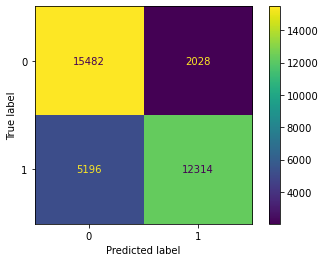


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1525, percentage = 20.3333%


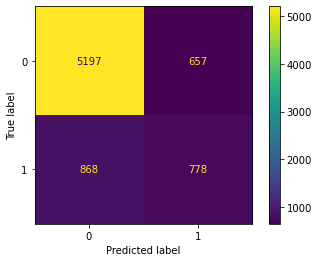

----------------
              precision    recall  f1-score   support

           0       0.86      0.89      0.87      5854
           1       0.54      0.47      0.51      1646

    accuracy                           0.80      7500
   macro avg       0.70      0.68      0.69      7500
weighted avg       0.79      0.80      0.79      7500



In [29]:
gnb4 = BernoulliNB() 
gnb4.fit(X_train_resampled, y_train_resampled)

print_metrics(gnb4, X_train_resampled, X_test, y_train_resampled, y_test)

## Decision Tree
**Output** - dt1 - dt7, plot_feature_performances()

Ran on ohe data  * **but not scaled** * data

### Initial Decision Tree
<pre>
Precision Score: Train 0.99980, Test 0.39812
Recall Score:    Train 0.99880, Test 0.41069
Accuracy Score:  Train 0.99969, Test 0.73440
F1 Score:        Train 0.99930, Test 0.40431
</pre>

Precision Score: Train 0.99980, Test 0.39812
Recall Score:	 Train 0.99880, Test 0.41069
Accuracy Score:	 Train 0.99969, Test 0.73440
F1 Score:	 Train 0.99930, Test 0.40431
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 7, percentage = 0.0311%


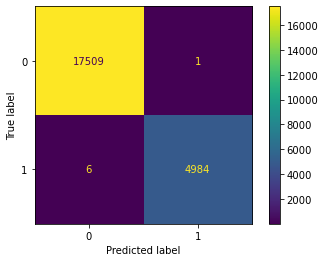


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1992, percentage = 26.5600%


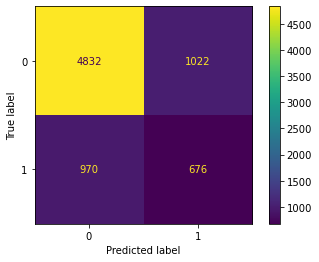

----------------
              precision    recall  f1-score   support

           0       0.83      0.83      0.83      5854
           1       0.40      0.41      0.40      1646

    accuracy                           0.73      7500
   macro avg       0.62      0.62      0.62      7500
weighted avg       0.74      0.73      0.74      7500


AUC is :0.62


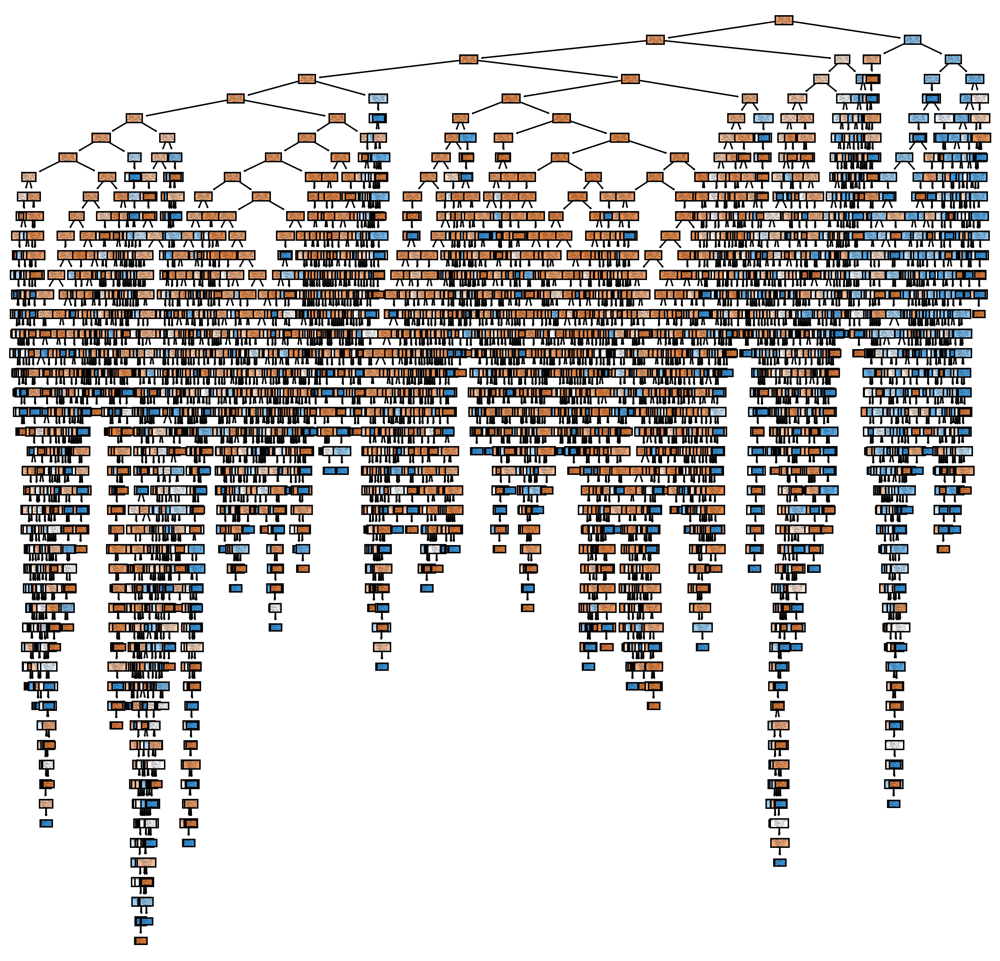

In [30]:
dt1 = DecisionTreeClassifier(criterion='entropy', random_state=10) # try with default GINI impurity next time
dt1.fit(X_train, y_train)

print_metrics(dt1, X_train, X_test, y_train, y_test)

### Decision Tree with Gini instead of Entropy
<pre>
Precision Score: Train 0.99980, Test 0.39200
Recall Score:    Train 0.99880, Test 0.42892
Accuracy Score:  Train 0.99969, Test 0.72867
F1 Score:        Train 0.99930, Test 0.40963
</pre>

Precision Score: Train 0.99980, Test 0.39200
Recall Score:	 Train 0.99880, Test 0.42892
Accuracy Score:	 Train 0.99969, Test 0.72867
F1 Score:	 Train 0.99930, Test 0.40963
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 7, percentage = 0.0311%


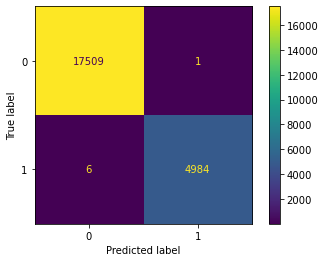


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 2035, percentage = 27.1333%


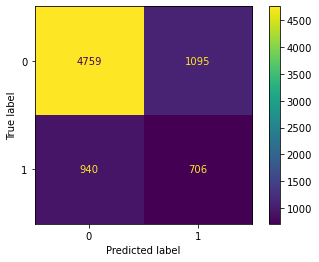

----------------
              precision    recall  f1-score   support

           0       0.84      0.81      0.82      5854
           1       0.39      0.43      0.41      1646

    accuracy                           0.73      7500
   macro avg       0.61      0.62      0.62      7500
weighted avg       0.74      0.73      0.73      7500


AUC is :0.62


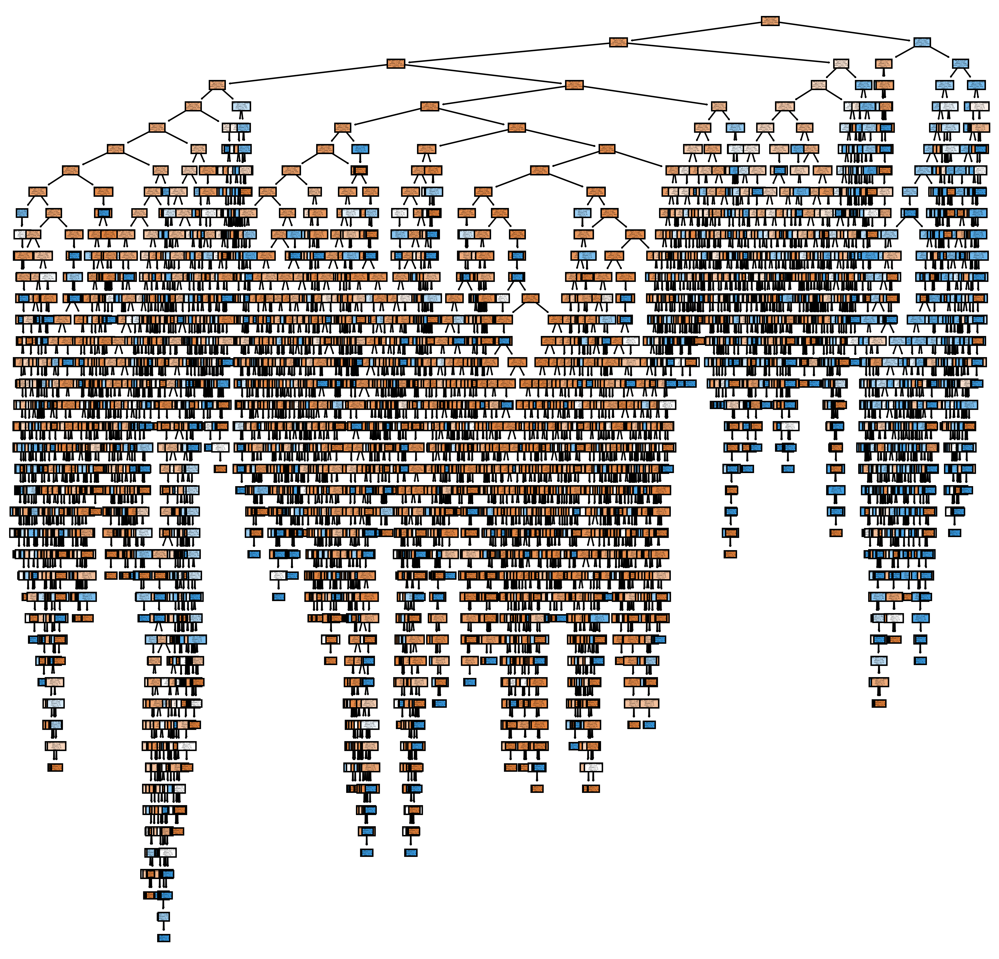

In [31]:
dt2 = DecisionTreeClassifier(random_state=10) # with GINI default
dt2.fit(X_train, y_train)

print_metrics(dt2, X_train, X_test, y_train, y_test)

### Decision Tree with Max Depth
Optimal Max_depth = 4  
<pre>
Precision Score: Train 0.67785, Test 0.66152
Recall Score:    Train 0.36433, Test 0.36452
Accuracy Score:  Train 0.82062, Test 0.81960
F1 Score:        Train 0.47393, Test 0.47004
</pre>

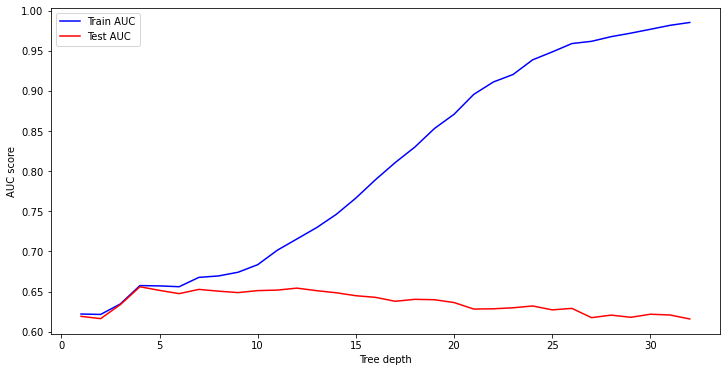

In [32]:
# Identify the optimal tree depth for given data
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
   dt3 = DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, random_state=10)
   dt3.fit(X_train, y_train)
   dt3_train_preds = dt3.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, dt3_train_preds)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous train results
   train_results.append(roc_auc)
   dt3_preds = dt3.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, dt3_preds)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous test results
   test_results.append(roc_auc)

plt.figure(figsize=(12,6))
plt.plot(max_depths, train_results, 'b', label='Train AUC')
plt.plot(max_depths, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.legend()
plt.show()

In [33]:
# Training error decreases with increasing tree depth - clear sign of overfitting 
# Test error increases after depth=3 - nothing more to learn from deeper trees (some fluctuations, but not stable)
# Optimal value seen here is 4

Precision Score: Train 0.67785, Test 0.66152
Recall Score:	 Train 0.36433, Test 0.36452
Accuracy Score:	 Train 0.82062, Test 0.81960
F1 Score:	 Train 0.47393, Test 0.47004
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4036, percentage = 17.9378%


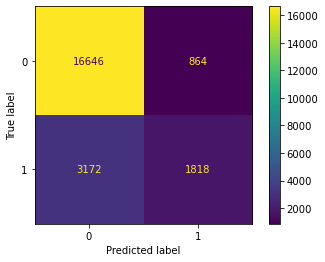


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1353, percentage = 18.0400%


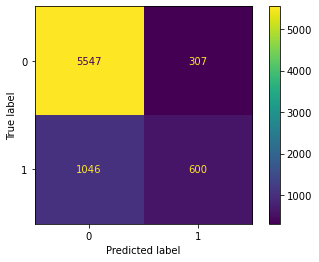

----------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5854
           1       0.66      0.36      0.47      1646

    accuracy                           0.82      7500
   macro avg       0.75      0.66      0.68      7500
weighted avg       0.80      0.82      0.80      7500


AUC is :0.66


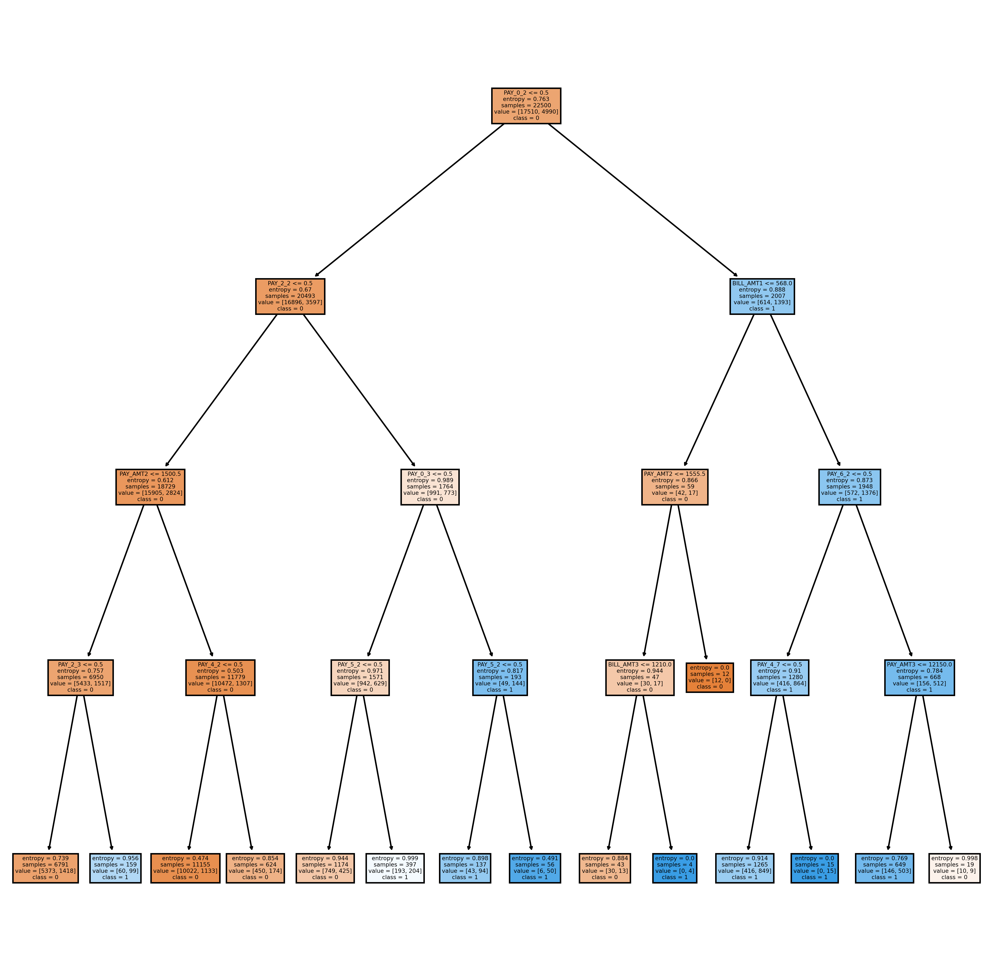

In [34]:
# Create the classifier, fit it on the training data and make predictions on the test set
dt3 = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=10) 
dt3.fit(X_train, y_train)

print_metrics(dt3, X_train, X_test, y_train, y_test)

### Decision Tree with Min Samples Split
Optimal min_samples_split = 0.4  
<pre>
Precision Score: Train 0.69407, Test 0.68333
Recall Score:    Train 0.27916, Test 0.27400
Accuracy Score:  Train 0.81284, Test 0.81280
F1 Score:        Train 0.39817, Test 0.39115
</pre>

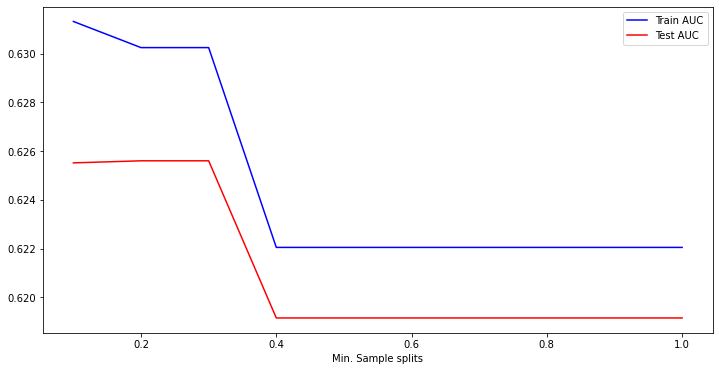

In [35]:
# Identify the optimal min-samples-split for given data
min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
   dt4 = DecisionTreeClassifier(criterion='entropy', min_samples_split=min_samples_split, random_state=10)
   dt4.fit(X_train, y_train)
   dt4_train_preds = dt4.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, dt4_train_preds)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   dt4_preds = dt4.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, dt4_preds)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)

plt.figure(figsize=(12,6))
plt.plot(min_samples_splits, train_results, 'b', label='Train AUC')
plt.plot(min_samples_splits, test_results, 'r', label='Test AUC')
plt.xlabel('Min. Sample splits')
plt.legend()
plt.show()

In [36]:
# AUC for both test and train data stabilizes at 0.4
# Further increase in minimum sample split does not improve learning 

Precision Score: Train 0.69407, Test 0.68333
Recall Score:	 Train 0.27916, Test 0.27400
Accuracy Score:	 Train 0.81284, Test 0.81280
F1 Score:	 Train 0.39817, Test 0.39115
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4211, percentage = 18.7156%


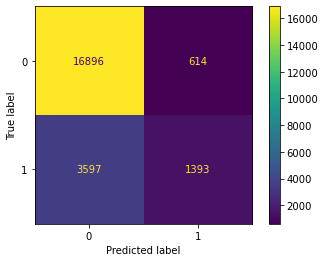


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1404, percentage = 18.7200%


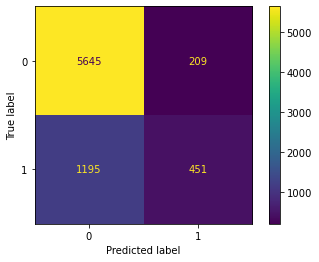

----------------
              precision    recall  f1-score   support

           0       0.83      0.96      0.89      5854
           1       0.68      0.27      0.39      1646

    accuracy                           0.81      7500
   macro avg       0.75      0.62      0.64      7500
weighted avg       0.79      0.81      0.78      7500


AUC is :0.62


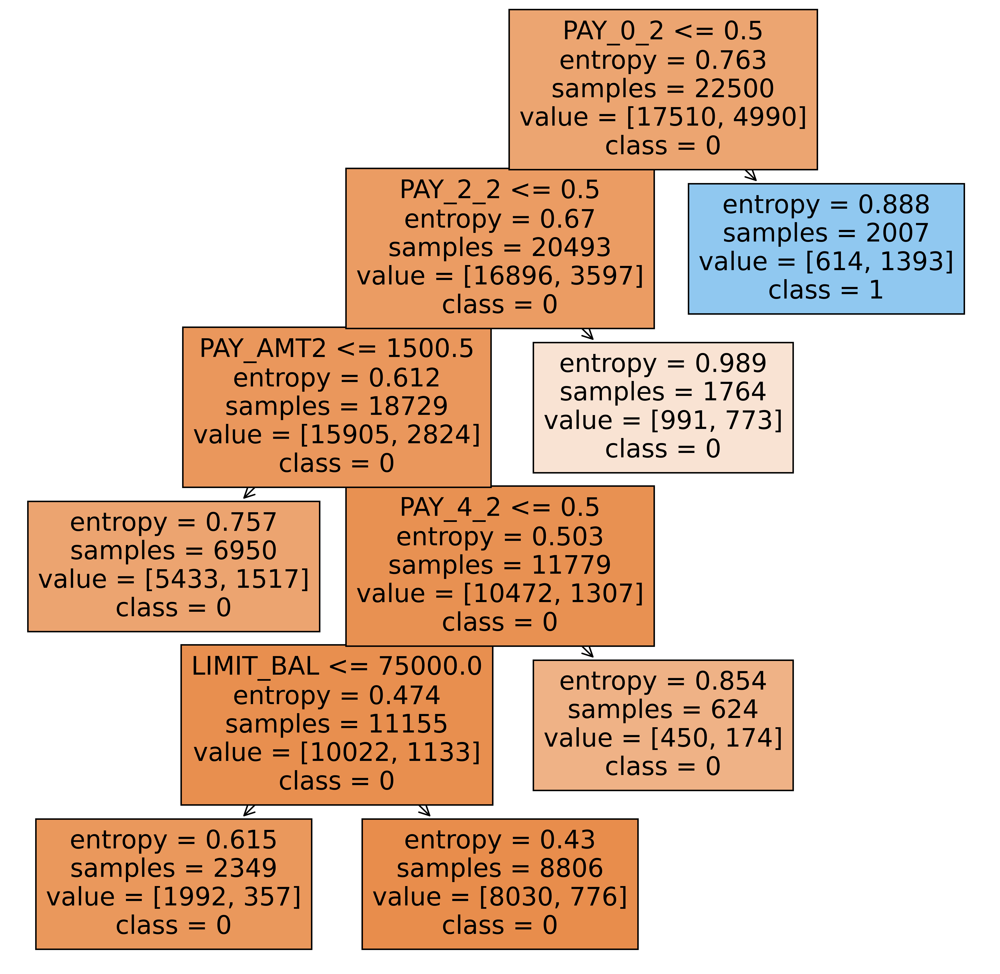

In [37]:
# Create the classifier, fit it on the training data and make predictions on the test set
dt4 = DecisionTreeClassifier(criterion='entropy', min_samples_split=0.4, random_state=10) 
dt4.fit(X_train, y_train)

print_metrics(dt4, X_train, X_test, y_train, y_test)

### Decision Tree with Min Samples Leaf
Optimal min_samples_leaf = 0.10  
<pre>
Precision Score: Train 0.55267, Test 0.56684
Recall Score:    Train 0.32806, Test 0.33232
Accuracy Score:  Train 0.79209, Test 0.79773
F1 Score:        Train 0.41172, Test 0.41900
</pre>

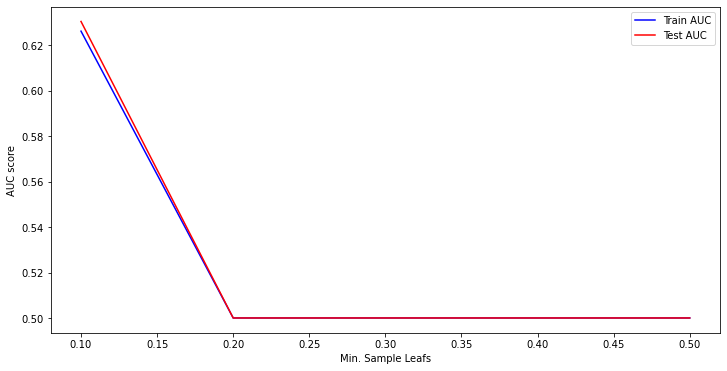

In [38]:
# Calculate the optimal value for minimum sample leafs
min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
train_results = []
test_results = []
for min_samples_leaf in min_samples_leafs:
   dt5 = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=min_samples_leaf, random_state=10)
   dt5.fit(X_train, y_train)
   train_pred = dt5.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt5.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
    
plt.figure(figsize=(12,6))    
plt.plot(min_samples_leafs, train_results, 'b', label='Train AUC')
plt.plot(min_samples_leafs, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('Min. Sample Leafs')
plt.legend()
plt.show()

In [39]:
# AUC gives best value at 0.1 for both test and training sets 
# Setting a higher minimum per leaf restricts our model too much
# The accuracy drops down if we continue to increase the parameter value 

Precision Score: Train 0.55267, Test 0.56684
Recall Score:	 Train 0.32806, Test 0.33232
Accuracy Score:	 Train 0.79209, Test 0.79773
F1 Score:	 Train 0.41172, Test 0.41900
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4678, percentage = 20.7911%


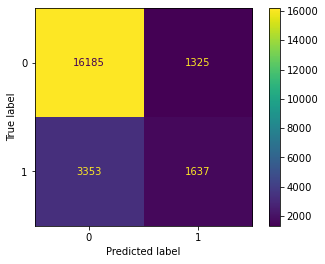


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1517, percentage = 20.2267%


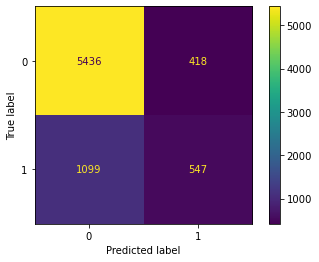

----------------
              precision    recall  f1-score   support

           0       0.83      0.93      0.88      5854
           1       0.57      0.33      0.42      1646

    accuracy                           0.80      7500
   macro avg       0.70      0.63      0.65      7500
weighted avg       0.77      0.80      0.78      7500


AUC is :0.63


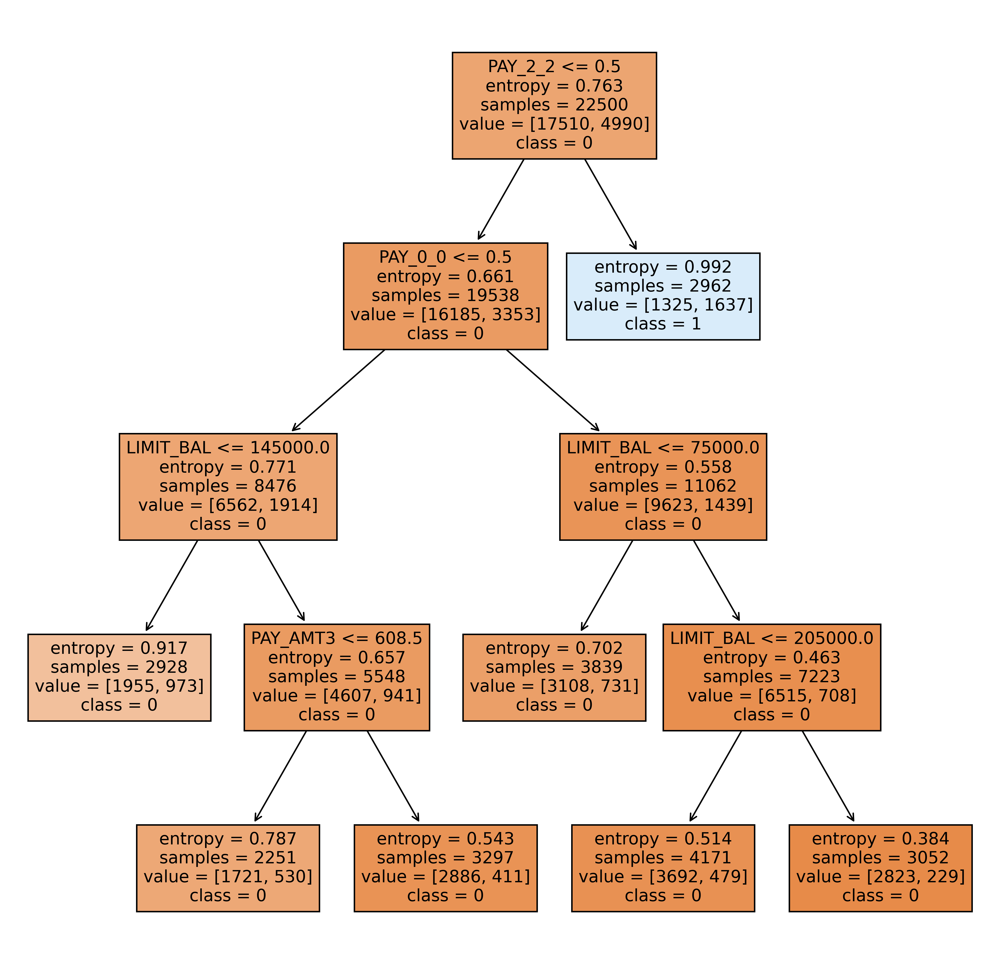

In [40]:
# Create the classifier, fit it on the training data and make predictions on the test set
dt5 = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=0.10, random_state=10) 
dt5.fit(X_train, y_train)

print_metrics(dt5, X_train, X_test, y_train, y_test)

### Decision Tree with Max Features
Optimal max_features = 46  
<pre>
Precision Score: Train 0.99980, Test 0.41353
Recall Score:    Train 0.99880, Test 0.42710
Accuracy Score:  Train 0.99969, Test 0.74133
F1 Score:        Train 0.99930, Test 0.42020
</pre>

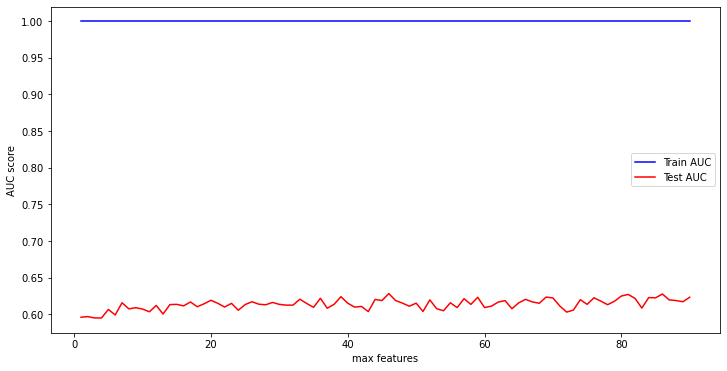

In [41]:
max_features = list(range(1, X_train.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
   dt6 = DecisionTreeClassifier(criterion='entropy', max_features=max_feature, random_state=10)
   dt6.fit(X_train, y_train)
   train_pred = dt6.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = dt6.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)

plt.figure(figsize=(12,6))
plt.plot(max_features, train_results, 'b', label='Train AUC')
plt.plot(max_features, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('max features')
plt.legend()
plt.show()

In [42]:
# No clear effect on the training dataset - flat AUC 
# Some fluctuations in test AUC but not definitive enough to make a judgement
# Highest AUC value seen at 45

Precision Score: Train 0.99980, Test 0.41353
Recall Score:	 Train 0.99880, Test 0.42710
Accuracy Score:	 Train 0.99969, Test 0.74133
F1 Score:	 Train 0.99930, Test 0.42020
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 7, percentage = 0.0311%


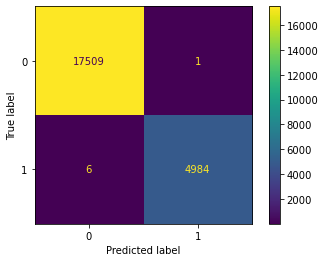


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1940, percentage = 25.8667%


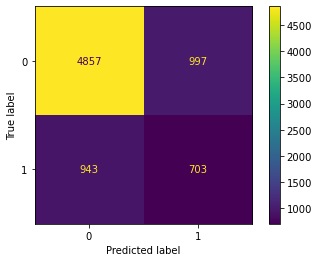

----------------
              precision    recall  f1-score   support

           0       0.84      0.83      0.83      5854
           1       0.41      0.43      0.42      1646

    accuracy                           0.74      7500
   macro avg       0.63      0.63      0.63      7500
weighted avg       0.74      0.74      0.74      7500


AUC is :0.63


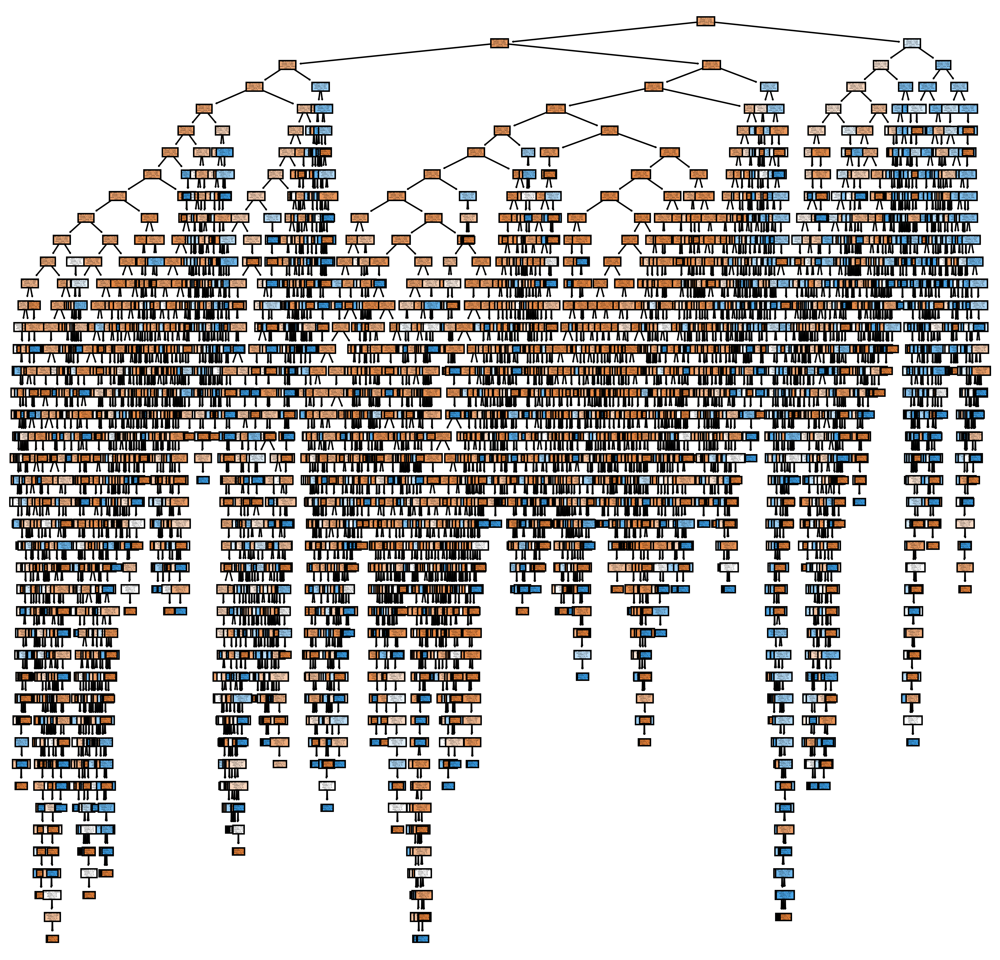

In [43]:
dt6 = DecisionTreeClassifier(criterion='entropy', max_features=46, random_state=10) 
dt6.fit(X_train, y_train)

print_metrics(dt6, X_train, X_test, y_train, y_test)

### Decision Tree with All Optimal Parameters
Optimal Max_depth = 4  
Optimal min_samples_split = 0.4  
Optimal min_samples_leaf = 0.10  
Optimal max_features = 46  
<pre>
Precision Score: Train 0.55267, Test 0.56684
Recall Score:    Train 0.32806, Test 0.33232
Accuracy Score:  Train 0.79209, Test 0.79773
F1 Score:        Train 0.41172, Test 0.41900
</pre>

Precision Score: Train 0.55267, Test 0.56684
Recall Score:	 Train 0.32806, Test 0.33232
Accuracy Score:	 Train 0.79209, Test 0.79773
F1 Score:	 Train 0.41172, Test 0.41900
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4678, percentage = 20.7911%


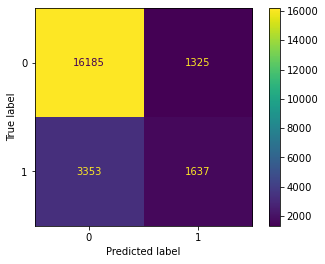


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1517, percentage = 20.2267%


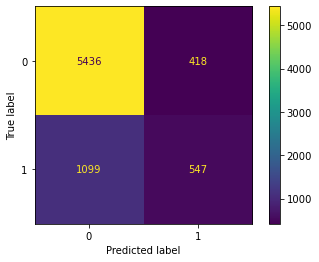

----------------
              precision    recall  f1-score   support

           0       0.83      0.93      0.88      5854
           1       0.57      0.33      0.42      1646

    accuracy                           0.80      7500
   macro avg       0.70      0.63      0.65      7500
weighted avg       0.77      0.80      0.78      7500


AUC is :0.63


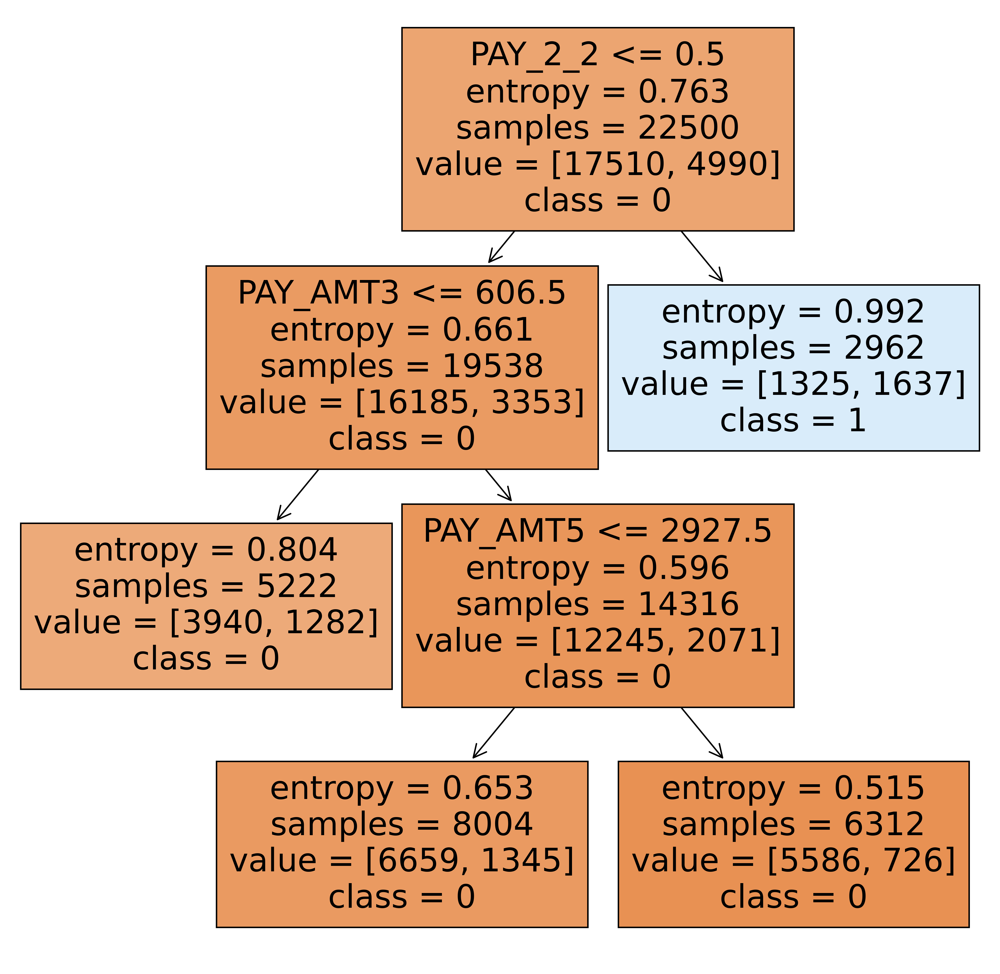

In [44]:
# Create the classifier, fit it on the training data and make predictions on the test set
dt7 = DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_split=0.4, 
                              min_samples_leaf=0.10, max_features=46, random_state=10) 
dt7.fit(X_train, y_train)

print_metrics(dt7, X_train, X_test, y_train, y_test)

In [45]:
# Max Depth appears to have had the best impact on our model

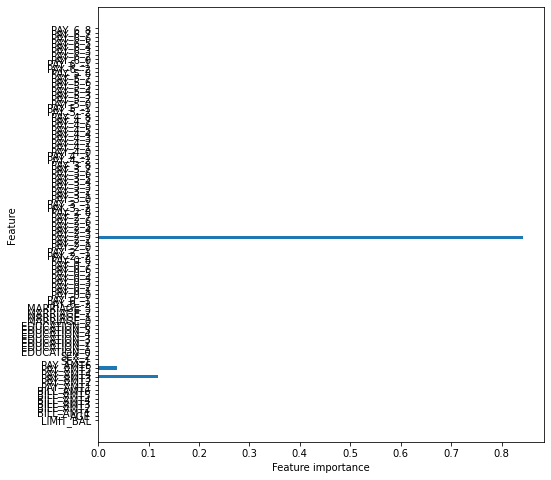

In [46]:
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(8,8))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel('Feature importance')
    plt.ylabel('Feature')

plot_feature_importances(dt7)

## Ensemble Methods
**Output** - bagged_tree, forest, rf_tree_1

Ran on ohe data  * **but not scaled** * data

### Bagged Tree
<pre>
Precision Score: Train 0.70514, Test 0.68254
Recall Score:    Train 0.34890, Test 0.33961
Accuracy Score:  Train 0.82324, Test 0.82040
F1 Score:        Train 0.46682, Test 0.45355
</pre>

Precision Score: Train 0.71309, Test 0.68335
Recall Score:	 Train 0.34269, Test 0.33171
Accuracy Score:	 Train 0.82364, Test 0.81960
F1 Score:	 Train 0.46291, Test 0.44663
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 3968, percentage = 17.6356%


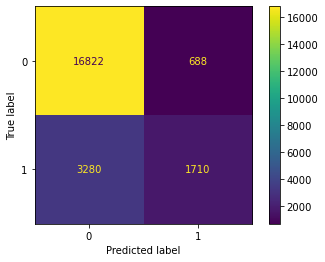


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1353, percentage = 18.0400%


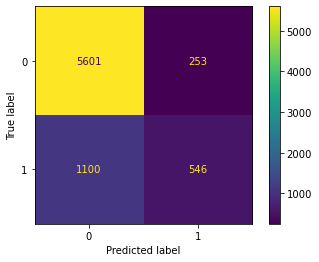

----------------
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      5854
           1       0.68      0.33      0.45      1646

    accuracy                           0.82      7500
   macro avg       0.76      0.64      0.67      7500
weighted avg       0.80      0.82      0.79      7500



In [47]:
bagged_tree =  BaggingClassifier(DecisionTreeClassifier(criterion='gini', max_depth=5), n_estimators=20)
bagged_tree.fit(X_train, y_train)

print_metrics(bagged_tree, X_train, X_test, y_train, y_test)

### Random Forest
<pre>
Precision Score: Train 0.72932, Test 0.70556
Recall Score:    Train 0.23327, Test 0.23147
Accuracy Score:  Train 0.81076, Test 0.81013
F1 Score:        Train 0.35348, Test 0.34858
</pre>

Precision Score: Train 0.71959, Test 0.70501
Recall Score:	 Train 0.22525, Test 0.23086
Accuracy Score:	 Train 0.80871, Test 0.81000
F1 Score:	 Train 0.34310, Test 0.34783
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4304, percentage = 19.1289%


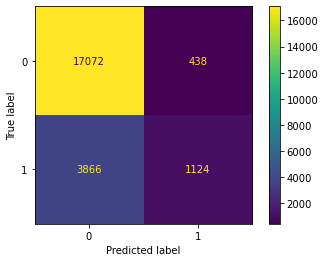


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1425, percentage = 19.0000%


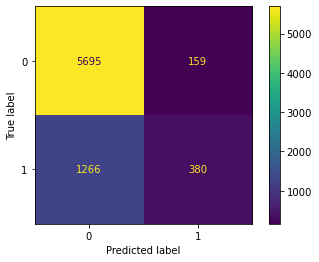

----------------
              precision    recall  f1-score   support

           0       0.82      0.97      0.89      5854
           1       0.71      0.23      0.35      1646

    accuracy                           0.81      7500
   macro avg       0.76      0.60      0.62      7500
weighted avg       0.79      0.81      0.77      7500



In [48]:
forest = RandomForestClassifier(n_estimators=100, max_depth= 5)
forest.fit(X_train, y_train)

print_metrics(forest, X_train, X_test, y_train, y_test)

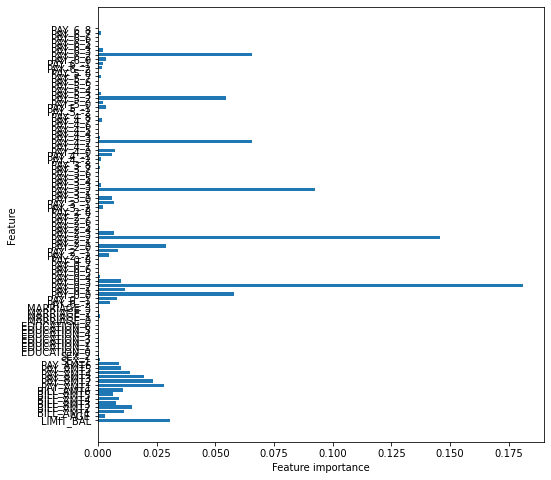

In [49]:
plot_feature_importances(forest)

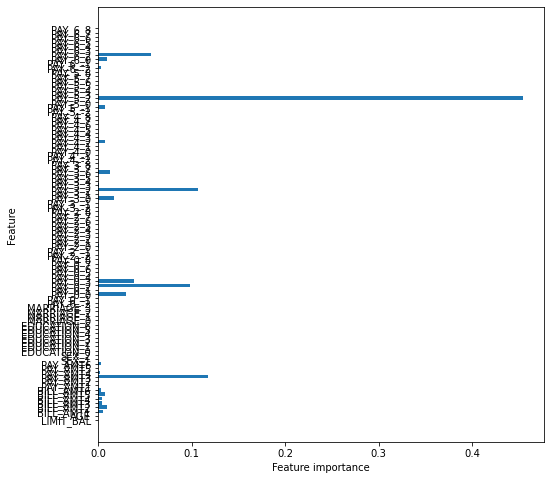

In [50]:
rf_tree_1 = forest.estimators_[0]
plot_feature_importances(rf_tree_1)

## Grid Search
**Output** - gs_clf, gs_tree, gs_param_grid, dt_gs_training_score, dt_gs_testing_score, rf_clf, mean_rf_cv_score, rf_param_grid, rf_grid_search, dt_score, rf_score 


Ran on ohe data  * **but not scaled** * data

### Grid Search with Decision Tree
Optimal criterion = 'entropy'  
Optimal min_samples_split = 0.1  
Optimal max_depth = 10    
<pre>
Precision Score: Train 0.69008, Test 0.67181
Recall Score:    Train 0.30120, Test 0.29101
Accuracy Score:  Train 0.81502, Test 0.81320
F1 Score:        Train 0.41936, Test 0.40610
</pre>

In [51]:
gs_clf = DecisionTreeClassifier()

gs_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [2, 5, 10, 20],
    'min_samples_split': [.1, .3, .7, .9]
}

gs_tree = GridSearchCV(gs_clf, gs_param_grid, cv=3, return_train_score=True)
gs_tree.fit(X_train, y_train)

# Mean training score
dt_gs_training_score = np.mean(gs_tree.cv_results_['mean_train_score'])

# Mean test score
dt_gs_testing_score = gs_tree.score(X_test, y_test)

print(f"Mean Training Score: {dt_gs_training_score :.2%}")
print(f"Mean Test Score: {dt_gs_testing_score :.2%}")
print("Best Parameter Combination Found During Grid Search:")

gs_tree.best_params_

Mean Training Score: 81.35%
Mean Test Score: 81.32%
Best Parameter Combination Found During Grid Search:


{'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 0.1}

Precision Score: Train 0.69008, Test 0.67181
Recall Score:	 Train 0.30120, Test 0.29101
Accuracy Score:	 Train 0.81502, Test 0.81320
F1 Score:	 Train 0.41936, Test 0.40610
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4162, percentage = 18.4978%


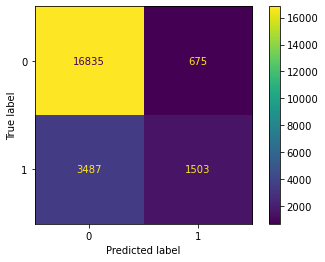


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1401, percentage = 18.6800%


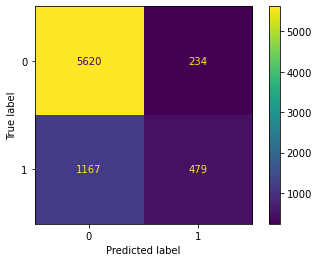

----------------
              precision    recall  f1-score   support

           0       0.83      0.96      0.89      5854
           1       0.67      0.29      0.41      1646

    accuracy                           0.81      7500
   macro avg       0.75      0.63      0.65      7500
weighted avg       0.79      0.81      0.78      7500



In [52]:
print_metrics(gs_tree, X_train, X_test, y_train, y_test)

### Grid Search with Random Forest
Optimal criterion = 'gini'  
Optimal min_samples_split = 5
Optimal min_samples_leaf = 3
Optimal max_depth = 10    
Optimal num_estimators = 100
<pre>
Precision Score: Train 0.77800, Test 0.67933
Recall Score:    Train 0.39118, Test 0.34751
Accuracy Score:  Train 0.84022, Test 0.82080
F1 Score:        Train 0.52060, Test 0.45981
</pre>

In [53]:
rf_clf = RandomForestClassifier()
mean_rf_cv_score = np.mean(cross_val_score(rf_clf, X_train, y_train, cv=3))

print(f"Mean Cross Validation Score for Random Forest Classifier: {mean_rf_cv_score :.2%}")

Mean Cross Validation Score for Random Forest Classifier: 81.36%


In [54]:
rf_param_grid = {
    'n_estimators': [10, 30, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2, 6, 10],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [3, 6]
}

In [55]:
rf_grid_search = GridSearchCV(rf_clf, rf_param_grid, cv=3)
rf_grid_search.fit(X_train, y_train)

print(f"Training Accuracy: {rf_grid_search.best_score_ :.2%}")
print("")
print(f"Optimal Parameters: {rf_grid_search.best_params_}")

Training Accuracy: 81.91%

Optimal Parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 5, 'n_estimators': 100}


In [56]:
dt_score = gs_tree.score(X_test, y_test)
rf_score = rf_grid_search.score(X_test, y_test)

print('Decision tree grid search: ', dt_score)
print('Random forest grid search: ', rf_score)

Decision tree grid search:  0.8132
Random forest grid search:  0.8209333333333333


Precision Score: Train 0.77160, Test 0.67972
Recall Score:	 Train 0.39198, Test 0.34812
Accuracy Score:	 Train 0.83942, Test 0.82093
F1 Score:	 Train 0.51987, Test 0.46043
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 3613, percentage = 16.0578%


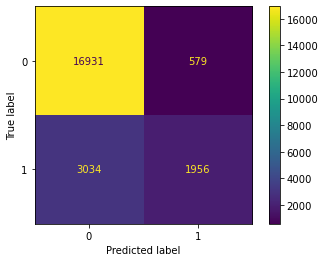


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1343, percentage = 17.9067%


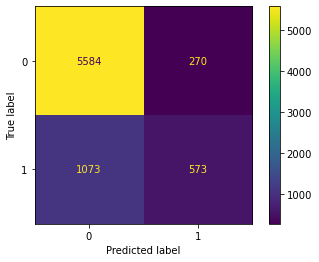

----------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5854
           1       0.68      0.35      0.46      1646

    accuracy                           0.82      7500
   macro avg       0.76      0.65      0.68      7500
weighted avg       0.80      0.82      0.80      7500



In [57]:
print_metrics(rf_grid_search, X_train, X_test, y_train, y_test)

## Boosting Models
**Output** - xgb_clf, grid_xgb, xgb_train_preds, xgb_test_preds, training_accuracy, test_accuracy, xgb_param_grid, grid_xgb_train_preds, grid_xgb_test_preds, xgb_best_parameters, adaboost_clf, gbt_clf

Ran on ohe data  * **but not scaled** * data

### AdaBoost
<pre>
Precision Score: Train 0.68087, Test 0.69027
Recall Score:    Train 0.33307, Test 0.33171
Accuracy Score:  Train 0.81747, Test 0.82067
F1 Score:        Train 0.44732, Test 0.44809
</pre>

Precision Score: Train 0.68087, Test 0.69027
Recall Score:	 Train 0.33307, Test 0.33171
Accuracy Score:	 Train 0.81747, Test 0.82067
F1 Score:	 Train 0.44732, Test 0.44809
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4107, percentage = 18.2533%


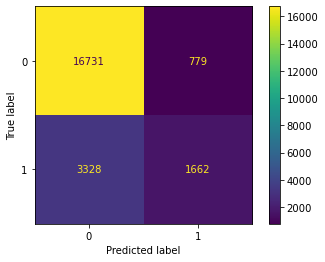


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1345, percentage = 17.9333%


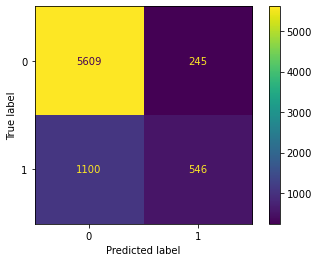

----------------
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      5854
           1       0.69      0.33      0.45      1646

    accuracy                           0.82      7500
   macro avg       0.76      0.64      0.67      7500
weighted avg       0.80      0.82      0.80      7500



In [58]:
adaboost_clf = AdaBoostClassifier(random_state=42)
adaboost_clf.fit(X_train, y_train)

print_metrics(adaboost_clf, X_train, X_test, y_train, y_test)

In [59]:
print('Mean Adaboost Cross-Val Score (k=5):')
print(cross_val_score(adaboost_clf, X, y, cv=5).mean())

Mean Adaboost Cross-Val Score (k=5):
0.8175000000000001


### GradientBoost
<pre>
Precision Score: Train 0.70564, Test 0.67200
Recall Score:    Train 0.37134, Test 0.35723
Accuracy Score:  Train 0.82622, Test 0.82067
F1 Score:        Train 0.48661, Test 0.46648
</pre>

Precision Score: Train 0.70564, Test 0.67200
Recall Score:	 Train 0.37134, Test 0.35723
Accuracy Score:	 Train 0.82622, Test 0.82067
F1 Score:	 Train 0.48661, Test 0.46648
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 3910, percentage = 17.3778%


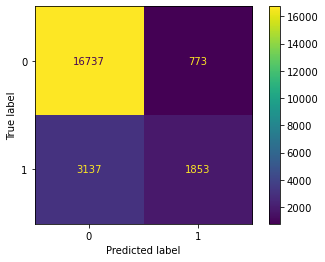


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1345, percentage = 17.9333%


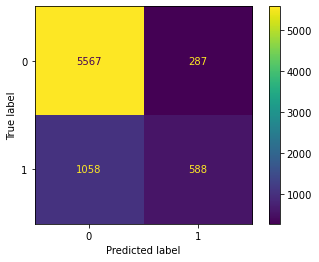

----------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5854
           1       0.67      0.36      0.47      1646

    accuracy                           0.82      7500
   macro avg       0.76      0.65      0.68      7500
weighted avg       0.80      0.82      0.80      7500



In [60]:
gbt_clf = GradientBoostingClassifier(random_state=42)
gbt_clf.fit(X_train, y_train)


print_metrics(gbt_clf, X_train, X_test, y_train, y_test)

In [61]:
print('Mean GBT Cross-Val Score (k=5):')
print(cross_val_score(gbt_clf, X, y, cv=5).mean())

Mean GBT Cross-Val Score (k=5):
0.8194666666666667


### Initial XGBoost
<pre>
Precision Score: Train 0.70337, Test 0.67795
Recall Score:    Train 0.36353, Test 0.35298
Accuracy Score:  Train 0.82484, Test 0.82120
F1 Score:        Train 0.47932, Test 0.46424
</pre>

Training Accuracy: 82.48%
Validation accuracy: 82.12%
------------------
Precision Score: Train 0.70337, Test 0.67795
Recall Score:	 Train 0.36353, Test 0.35298
Accuracy Score:	 Train 0.82484, Test 0.82120
F1 Score:	 Train 0.47932, Test 0.46424
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 3941, percentage = 17.5156%


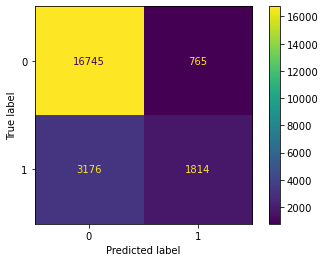


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1341, percentage = 17.8800%


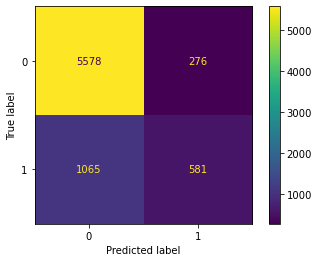

----------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5854
           1       0.68      0.35      0.46      1646

    accuracy                           0.82      7500
   macro avg       0.76      0.65      0.68      7500
weighted avg       0.80      0.82      0.80      7500



In [62]:
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train, y_train)

# Predict on training and test sets
xgb_train_preds = xgb_clf.predict(X_train)
xgb_test_preds = xgb_clf.predict(X_test)

# Accuracy of training and test sets
xgb_training_accuracy = accuracy_score(y_train, xgb_train_preds)
xgb_test_accuracy = accuracy_score(y_test, xgb_test_preds)

print('Training Accuracy: {:.4}%'.format(xgb_training_accuracy * 100))
print('Validation accuracy: {:.4}%'.format(xgb_test_accuracy * 100))
print('------------------')
print_metrics(xgb_clf, X_train, X_test, y_train, y_test)

### XGBoost with grid search
Grid Search found the following optimal parameters:  
learning_rate: 0.1  
max_depth: 6  
min_child_weight: 1  
n_estimators: 100  
subsample: 0.7  
<pre>
Precision Score: Train 0.79205, Test 0.65733
Recall Score:    Train 0.43507, Test 0.35662
Accuracy Score:  Train 0.84938, Test 0.81800
F1 Score:        Train 0.56163, Test 0.46239
</pre>

In [63]:
xgb_param_grid = {
    'learning_rate': [0.1, 0.2],
    'max_depth': [6],
    'min_child_weight': [1, 2],
    'subsample': [0.5, 0.7],
    'n_estimators': [100],
}

In [64]:
grid_xgb = GridSearchCV(xgb_clf, xgb_param_grid, scoring='accuracy', cv=None, n_jobs=1)
grid_xgb.fit(X_train, y_train)

xgb_best_parameters = grid_xgb.best_params_

print('Grid Search found the following optimal parameters: ')
for param_name in sorted(xgb_best_parameters.keys()):
    print('%s: %r' % (param_name, xgb_best_parameters[param_name]))

grid_xgb_train_preds = grid_xgb.predict(X_train)
grid_xgb_test_preds = grid_xgb.predict(X_test)
grid_xgb_training_accuracy = accuracy_score(y_train, grid_xgb_train_preds)
grid_xgb_test_accuracy = accuracy_score(y_test, grid_xgb_test_preds)

print('')
print('Training Accuracy: {:.4}%'.format(grid_xgb_training_accuracy * 100))
print('Validation accuracy: {:.4}%'.format(grid_xgb_test_accuracy * 100))

Grid Search found the following optimal parameters: 
learning_rate: 0.1
max_depth: 6
min_child_weight: 1
n_estimators: 100
subsample: 0.7

Training Accuracy: 84.94%
Validation accuracy: 81.8%


Precision Score: Train 0.79205, Test 0.65733
Recall Score:	 Train 0.43507, Test 0.35662
Accuracy Score:	 Train 0.84938, Test 0.81800
F1 Score:	 Train 0.56163, Test 0.46239
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 3389, percentage = 15.0622%


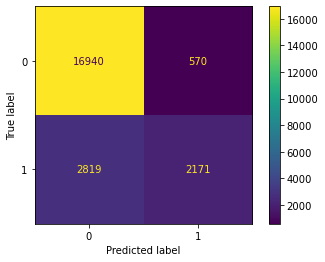


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1365, percentage = 18.2000%


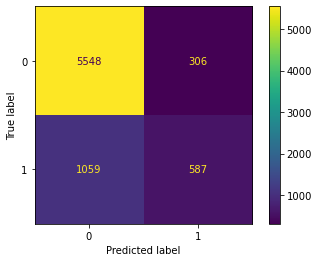

----------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5854
           1       0.66      0.36      0.46      1646

    accuracy                           0.82      7500
   macro avg       0.75      0.65      0.68      7500
weighted avg       0.80      0.82      0.80      7500



In [65]:
print_metrics(grid_xgb, X_train, X_test, y_train, y_test)

## Support Vector Classifications
<pre>
Precision Score: Train 0.99415, Test 0.17500  
Recall Score:    Train 0.03407, Test 0.00851  
Accuracy Score:  Train 0.78573, Test 0.77360  
F1 Score:        Train 0.06588, Test 0.01622
</pre>

In [67]:
from sklearn.svm import SVC  
from time import time
tic = time()
svclassifier = SVC(kernel='rbf', C=1000)  
svclassifier.fit(X_train, y_train) 
y_pred = svclassifier.predict(X_test)
toc = time()
print("run time is {} seconds".format(toc-tic))

run time is 527.6683864593506 seconds


Precision Score: Train 0.99415, Test 0.17500
Recall Score:	 Train 0.03407, Test 0.00851
Accuracy Score:	 Train 0.78573, Test 0.77360
F1 Score:	 Train 0.06588, Test 0.01622
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4821, percentage = 21.4267%


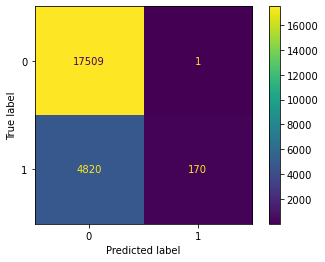


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1698, percentage = 22.6400%


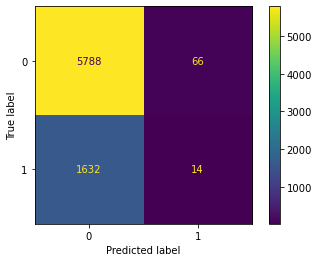

----------------
              precision    recall  f1-score   support

           0       0.78      0.99      0.87      5854
           1       0.17      0.01      0.02      1646

    accuracy                           0.77      7500
   macro avg       0.48      0.50      0.44      7500
weighted avg       0.65      0.77      0.68      7500



In [68]:
print_metrics(svclassifier, X_train, X_test, y_train, y_test)

## Pipeline

In [69]:
from sklearn.pipeline import Pipeline
scaled_pipeline_1 = Pipeline([('ss', StandardScaler()), 
                              ('svc', SVC(kernel='rbf', C=1000))])
scaled_pipeline_1.fit(X_train, y_train)
scaled_pipeline_1.score(X_test, y_test)

0.7909333333333334

In [70]:
scaled_pipeline_2 = Pipeline([('ss', StandardScaler()), 
                              ('RF', RandomForestClassifier(random_state=123))])

grid = [{'RF__max_depth': [4, 5], 
         'RF__min_samples_split': [5, 10], 
         'RF__min_samples_leaf': [3, 5]}]

In [71]:
gridsearch = GridSearchCV(estimator=scaled_pipeline_2, 
                          param_grid=grid, 
                          scoring='accuracy', 
                          cv=5)

gridsearch.fit(X_train, y_train)
gridsearch.score(X_test, y_test)

0.8102666666666667

In [72]:
gridsearch.best_params_

{'RF__max_depth': 5, 'RF__min_samples_leaf': 3, 'RF__min_samples_split': 5}

In [73]:
scaled_pipeline_3 = Pipeline([('ss', StandardScaler()), 
                              ('RF', RandomForestClassifier(max_depth=5,
                                                           min_samples_leaf=3,
                                                           min_samples_split=5))])
scaled_pipeline_3.fit(X_train, y_train)

Pipeline(steps=[('ss', StandardScaler()),
                ('RF',
                 RandomForestClassifier(max_depth=5, min_samples_leaf=3,
                                        min_samples_split=5))])

Precision Score: Train 0.71630, Test 0.70103
Recall Score:	 Train 0.24389, Test 0.24787
Accuracy Score:	 Train 0.81089, Test 0.81173
F1 Score:	 Train 0.36388, Test 0.36625
----------------

TRAIN Confusion Matrix
----------------
Number of mislabeled training points out of a total 22500 points : 4255, percentage = 18.9111%


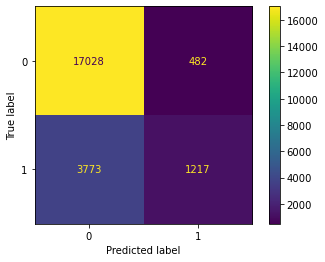


TEST Confusion Matrix
----------------
Number of mislabeled test points out of a total 7500 points : 1412, percentage = 18.8267%


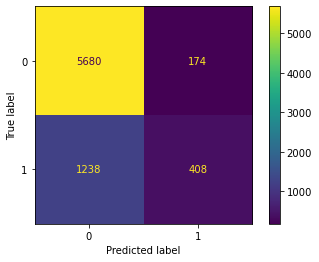

----------------
              precision    recall  f1-score   support

           0       0.82      0.97      0.89      5854
           1       0.70      0.25      0.37      1646

    accuracy                           0.81      7500
   macro avg       0.76      0.61      0.63      7500
weighted avg       0.79      0.81      0.77      7500



In [74]:
print_metrics(scaled_pipeline_3, X_train, X_test, y_train, y_test)

In [75]:
scaled_pipeline_3['RF'].feature_importances_

array([2.93593690e-02, 3.00299815e-03, 1.14122655e-02, 1.59758489e-02,
       8.28934295e-03, 1.06961760e-02, 9.75792857e-03, 1.05734637e-02,
       3.66751486e-02, 2.71209981e-02, 1.52003723e-02, 1.33209694e-02,
       7.58506041e-03, 8.65891251e-03, 4.91845289e-04, 6.22727584e-04,
       0.00000000e+00, 7.39119168e-04, 8.11302108e-04, 5.16231989e-04,
       0.00000000e+00, 1.87231048e-04, 1.93960459e-06, 0.00000000e+00,
       3.40684158e-04, 3.99750262e-04, 2.84813713e-05, 3.11165205e-03,
       6.46105337e-03, 6.53996059e-02, 1.71655404e-02, 1.78369644e-01,
       1.40557774e-02, 6.86727825e-04, 2.41272425e-05, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 3.48124283e-03, 1.07076107e-02,
       3.25242040e-02, 0.00000000e+00, 1.35388268e-01, 7.64249094e-03,
       1.31920718e-04, 0.00000000e+00, 0.00000000e+00, 2.10319046e-05,
       0.00000000e+00, 1.90469181e-03, 9.34341296e-03, 8.85876852e-03,
       0.00000000e+00, 8.38490050e-02, 9.28494519e-04, 2.16201418e-04,
      